In [40]:
COLAB = False
PARRALLEL_COMPUTING = True
RANDOM_SEED = 42

if COLAB:
  from google.colab import drive
  drive.mount('/content/drive')
  ROOT_DIR = '/content/drive/MyDrive/data/DMBD'

  from google.colab import data_table
  data_table.enable_dataframe_formatter()

else:
  ROOT_DIR = '.'

# Task 2

Study the evolution of bitcoin communities according to the bitcoin values, from 01/01/2015 to 01/06/2017.

## Import

In [41]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import TimeSeriesSplit, train_test_split, GridSearchCV
import os
from tqdm import tqdm
from community import community_louvain
import matplotlib.pyplot as plt
import networkx as nx
import os
import pandas as pd
import pickle

from concurrent.futures import ThreadPoolExecutor, ProcessPoolExecutor
from datetime import datetime
from tqdm import tqdm

In [42]:
import teneto
from teneto import TemporalNetwork

In [43]:
tqdm.pandas(desc="Computing ...")

## Load data

### Bitcoin transactions

First in order to load the collection we collect the files names

In [44]:
daily_bitcoin_files = [f for f in os.listdir(f'{ROOT_DIR}/networks')]
daily_bitcoin_files[:5]

['2015-1-1.csv',
 '2015-1-10.csv',
 '2015-1-11.csv',
 '2015-1-12.csv',
 '2015-1-13.csv']

Second, we load each file into a dataframe.  
And since the date is in the file name, we extract it and add it as a column to the dataframe.

In [45]:
def load_daily_bitcoin_transactions_file(filename):
  return pd.read_csv(f'{ROOT_DIR}/networks/{filename}'
  ).assign(
      Date=datetime.strptime(filename.split('.')[0], "%Y-%m-%d")
  )

In [46]:
if PARRALLEL_COMPUTING :
  with ThreadPoolExecutor() as executor:
    daily_bitcoin_transactions = list(
        tqdm(
            executor.map(load_daily_bitcoin_transactions_file, daily_bitcoin_files),
            total=len(daily_bitcoin_files),
            desc="Loading files in parrallel ..."
        )
    )
else:
  daily_bitcoin_transaction = [
      load_daily_bitcoin_transactions_file(file)
      for file in tqdm(daily_bicoin_files, "Loading files ...")
      ]

Loading files in parrallel ...:  15%|█▍        | 135/912 [00:00<00:03, 237.56it/s]

Loading files in parrallel ...: 100%|██████████| 912/912 [00:03<00:00, 244.38it/s]


Finally, we concatenate all the dataframes into one.  

In [47]:
transaction_network_df = pd.concat(daily_bitcoin_transactions)

### Bitcoin values

Since we want to study the evolution of bitcoin communities according to the bitcoin values, we need to load the bitcoin values.  
For this we use the [data on this site](https://www.in2013dollars.com/bitcoin-price) that we converted on a csv file availible on [kaggle](https://www.kaggle.com/datasets/williammaillard/bitcoin-value-monthly-evolution/download?datasetVersionNumber=1).  
Then we load it into a dataframe.

In [48]:
!pip install -q opendatasets


[notice] A new release of pip is available: 23.0.1 -> 23.3.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [49]:
import opendatasets as od

bitcoin_dataset_name = 'bitcoin-value-monthly-evolution'

od.download(
    'https://www.kaggle.com/datasets/williammaillard/bitcoin-value-monthly-evolution',
    data_dir=ROOT_DIR)

Skipping, found downloaded files in ".\bitcoin-value-monthly-evolution" (use force=True to force download)


In [50]:
bitcoin_value_df = pd.read_csv(f'{ROOT_DIR}/bitcoin-value-monthly-evolution/bitcoin_months_values.csv')

In [51]:
bitcoin_value_df.head()

,Year,Month,Bitcoin Price ($),Change ($),Month-over-month (%)
0,2017,6,2407.88,986.28,69.38
1,2017,5,1421.60,341.10,31.57
2,2017,4,1080.50,-142.00,-11.62
3,2017,3,1222.50,233.48,23.61
4,2017,2,989.02,-9.30,-0.93


In [52]:
def create_year_month_period(row):
    return pd.Period(f'{int(row.Year)}-{int(row.Month)}', freq='M')

In [53]:
bitcoin_value_df['Date'] = bitcoin_value_df.progress_apply(create_year_month_period, axis=1)

Computing ...: 100%|██████████| 30/30 [00:00<00:00, 12710.01it/s]


In [54]:
del bitcoin_value_df['Year']
del bitcoin_value_df['Month']
bitcoin_value_df.head()

,Bitcoin Price ($),Change ($),Month-over-month (%),Date
0,2407.88,986.28,69.38,2017-06
1,1421.60,341.10,31.57,2017-05
2,1080.50,-142.00,-11.62,2017-04
3,1222.50,233.48,23.61,2017-03
4,989.02,-9.30,-0.93,2017-02


In [55]:
bitcoin_value_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30 entries, 0 to 29
Data columns (total 4 columns):
 #   Column                Non-Null Count  Dtype    
---  ------                --------------  -----    
 0   Bitcoin Price ($)     30 non-null     float64  
 1   Change ($)            30 non-null     float64  
 2   Month-over-month (%)  30 non-null     float64  
 3   Date                  30 non-null     period[M]
dtypes: float64(3), period[M](1)
memory usage: 1.1 KB


## Data cleaning

In [56]:
len(daily_bitcoin_transactions)

912

We have 912 files ce qui correspond à notre interval de 2 ans et demi (365*2,5 ~ 912), on n'a donc pas de jours manquant.  
Regardons les données contenus dans nos dataframe pour avoir une idée du preprocess à réaliser.

In [57]:
transaction_network_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5876734 entries, 0 to 5654
Data columns (total 5 columns):
 #   Column           Dtype         
---  ------           -----         
 0   Source           object        
 1   Target           object        
 2   value            int64         
 3   nb_transactions  int64         
 4   Date             datetime64[us]
dtypes: datetime64[us](1), int64(2), object(2)
memory usage: 269.0+ MB


In [58]:
transaction_network_df.head()

,Source,Target,value,nb_transactions,Date
0,ePay.info_CoinJoinMess,CloudBet.com,3519173,1,2015-01-01
1,Cex.io,1956,8491196,3,2015-01-01
2,157228,C-Cex.com,10833480021,1,2015-01-01
3,0,421,27123449,8,2015-01-01
4,BTCGuild.com,787953,2507884460,1,2015-01-01


In [59]:
summary_df = transaction_network_df.describe(exclude="datetime64")
summary_df

,Source,Target,value,nb_transactions
count,5876734,5876734,5.876734e+06,5.876734e+06
unique,9915,9815,NaN,NaN
top,ePay.info_CoinJoinMess,0,NaN,NaN
freq,232016,148081,NaN,NaN
mean,NaN,NaN,4.959313e+10,6.409414e+00
std,NaN,NaN,1.117547e+12,7.640905e+01
min,NaN,NaN,1.100000e+01,1.000000e+00
25%,NaN,NaN,1.758358e+07,1.000000e+00
50%,NaN,NaN,1.183139e+08,1.000000e+00
75%,NaN,NaN,1.000000e+09,2.000000e+00


The first thing we can notice is that the source and target column are of type object, which is not optimal for graph library used later, and also because they contain different types such as int64 and str.  
Thus we will need a reversible function to convert them to int64.  

On the other hand, two columns (value and nb_transaction) could be suse as the weight of the edges. Since we want to find communities among those data we decided that considering the number of transaction is more relevant than the value.  
Nethertheless, we will keep the value column that might be used for computing statistics of communities later.  

### Convert source and target to int64

In [60]:
vectorized_column_name = ['Source', 'Target']

In [61]:
class ColumnVectorizer():

    def __init__(self, df, col_names):
        self.df = df
        self.col_names = col_names
        self.vectorizer = {}
        self.reverse_vectorizer = {}
        self.create_column_vectorizer()


    def create_column_vectorizer(self) -> tuple[dict, dict]:
        """
        Vectorize the content of the columns name of the dataframe given.
        If multiple column are given that means that their content in linked somehow and
        will be treated in consequence.
        """
        # 1. Collect all the values of the columns
        col_values = []
        for c in self.col_names:
            col_values += self.df[c].astype(str).tolist()

        # 2. Delete duplicated entries
        k=0

        for i in col_values:
            if i not in self.vectorizer:
                self.vectorizer[i] = k
                self.reverse_vectorizer[k] = i
                k += 1

    def _vectorize(self, x:any) -> int:
        return self.vectorizer[x]


    def _reverse_vectorize(self, x:int) -> any:
        return self.reverse_vectorizer[x]

    def vectorize(self) -> pd.DataFrame:
        for c in self.col_names:
            self.df[c] = self.df[c].progress_apply(self._vectorize)
        return self.df

    def reverse_vectorize(self) -> pd.DataFrame:
        for c in self.col_names:
            self.df[c] = self.df[c].progress_apply(self._reverse_vectorize)
        return self.df

In [62]:

vectorizer = ColumnVectorizer(transaction_network_df, vectorized_column_name)

In [63]:
transaction_network_df = vectorizer.vectorize()

Computing ...: 100%|██████████| 5876734/5876734 [00:05<00:00, 1053096.53it/s]


In [64]:
transaction_network_df.head()

,Source,Target,value,nb_transactions,Date
0,0,1178,3519173,1,2015-01-01
1,1,20,8491196,3,2015-01-01
2,2,46,10833480021,1,2015-01-01
3,3,91,27123449,8,2015-01-01
4,4,1207,2507884460,1,2015-01-01


In [65]:
transaction_network_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5876734 entries, 0 to 5654
Data columns (total 5 columns):
 #   Column           Dtype         
---  ------           -----         
 0   Source           int64         
 1   Target           int64         
 2   value            int64         
 3   nb_transactions  int64         
 4   Date             datetime64[us]
dtypes: datetime64[us](1), int64(4)
memory usage: 269.0 MB


### Missing values

We check if there is any missing value in the dataset that can noice the results.

In [66]:
missing_values = transaction_network_df.isnull().sum()
missing_values

Source             0
Target             0
value              0
nb_transactions    0
Date               0
dtype: int64

In [67]:
missing_values = transaction_network_df.isna().sum()
missing_values

Source             0
Target             0
value              0
nb_transactions    0
Date               0
dtype: int64

So there is no missing value in the dataset. We have done with the data cleaning stage.

## Data preprocessing

Finally, after some test to create temporal graph with teneto with a snapshot for each days we realize that the amount of memory needed was too big. Therefor we decided to concatenante the data by months in order to reduce this amount.  
For that we do a group and then apply an agregate function which is kind of an equivalent of a reduceByKey for pandas.

### Drop days information

In [68]:
transaction_network_df['Date'] = transaction_network_df['Date'].dt.to_period('M')

In [69]:
transaction_network_df.head()

,Source,Target,value,nb_transactions,Date
0,0,1178,3519173,1,2015-01
1,1,20,8491196,3,2015-01
2,2,46,10833480021,1,2015-01
3,3,91,27123449,8,2015-01
4,4,1207,2507884460,1,2015-01


### Agregate by month

In [70]:
tn_month_df = transaction_network_df.groupby(['Date', 'Source', 'Target']).sum()
tn_month_df = tn_month_df.reset_index()

In [71]:
tn_month_df.head()

,Date,Source,Target,value,nb_transactions
0,2015-01,0,1,104086696390356,4471
1,2015-01,0,3,153489412416368,15712
2,2015-01,0,5,1777376845,32
3,2015-01,0,6,12773669220604,735
4,2015-01,0,9,3121532603463,353


In [72]:
i = pd.Period('2015-04', freq='M')
tn_month_df[ tn_month_df['Date'] == i].head()

,Date,Source,Target,value,nb_transactions
66775,2015-04,0,1,97539308958386,5912
66776,2015-04,0,3,296039174861697,35978
66777,2015-04,0,4,372469343,2
66778,2015-04,0,5,11180350564,107
66779,2015-04,0,6,22438499535292,1643


In [73]:
print(f'Size before: {transaction_network_df.shape}')
print(f'Size after: {tn_month_df.shape}')
print(f'Difference: {transaction_network_df.shape[0] - tn_month_df.shape[0]}')

Size before: (5876734, 5)
Size after: (1458427, 5)
Difference: 4418307


We can notice that we have drasticly reduce the amount of data.  
It also important to notice that reducing the time slice will also improve the tracking of the community over time beacuase it's specify in the subject that the files contains the more active actors of the day. Therefore some transactions might be missing, that could lead to some community to disapear for one day and reapear the next one.  
That is less likely to happend we a month interval (i.e false death of a community).

# Temporal graph with networkx

Networkx doesn't have a data structure for temporal graph.  
Therefor we need to store each snapshot in a dictionnary with the Date as key.  
We can then compute the community the first snapshot and then using a similarity measure, in our case the Jaccard similarity, to track the communities life events listed in this [paper]( https://arxiv.org/ftp/arxiv/papers/1207/1207.4297.pdf):

- Continuation: the community is still active
- Split: the community is divided into two or more communities
- Merge: two or more communities are merged into one
- Birth: a new community is created
- Death: a community disappears
- shrink: a community loses some of its members but continues to exist
- grow: a community gains new members but continues to exist

### Build the graph dictionary

From the preprocessed dataframe we build a dictionnary of graph with the date as key and the graph as value.  

In [74]:
def create_dict_of_graphs(df:pd.DataFrame) -> dict:
    """
    Create a dictionnary of graphs where the key is the date and the value is the graph
    """
    graphs = {}
    for i in tqdm(df['Date'].unique(), desc="Creating graphs ..."):
        graphs[i] = nx.from_pandas_edgelist(
            df[df['Date'] == i],
            source='Source',
            target='Target',
            edge_attr=['value', 'nb_transactions'],
            create_using=nx.MultiDiGraph
        )
    return graphs

In [75]:
monthly_graphs = create_dict_of_graphs(tn_month_df)

Creating graphs ...:   7%|▋         | 2/30 [00:00<00:02, 10.62it/s]

Creating graphs ...: 100%|██████████| 30/30 [00:08<00:00,  3.53it/s]


Let's see how the graph looks like for the first snapshot.

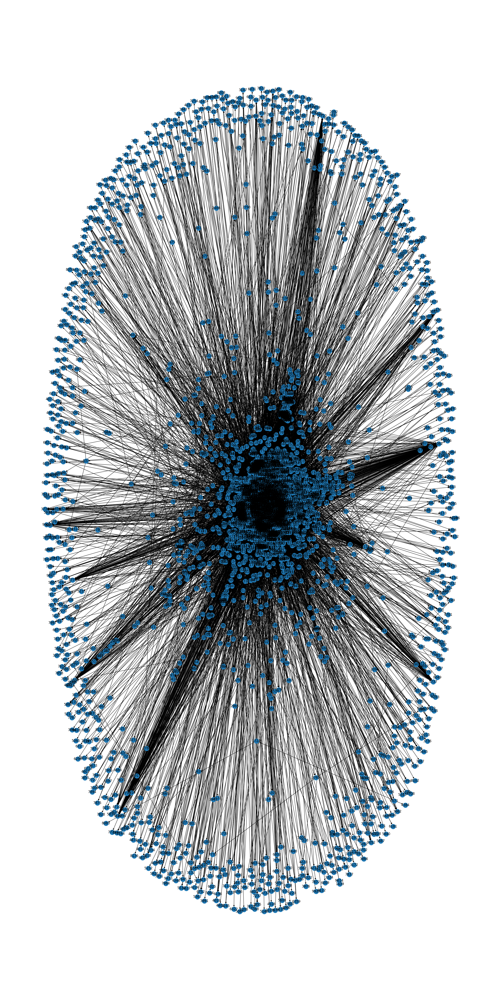

In [76]:
# i = pd.Period('2015-01', freq='M')

# plt.figure(figsize=(25, 50))
# nx.draw(monthly_graphs[i], with_labels=True)
# plt.show()

The graph take approximately 2m to be computed.  
On this graph we can see see in the center some strongly related nodes that form communities and on the periphery some nodes that might form a community on their own except for some nodes that are strongly related to the center.  
Therefor with chose the louvain algorithm to compute community due to its computation in O(n log n).

In [77]:
community_evolution = {}
community_save_path = f'{ROOT_DIR}/save/louvain_community_evolution_dict.pkl'

In [78]:
def create_community(args):
  date, graph = args
  return (date, nx.algorithms.community.louvain.louvain_communities(graph))
# greedy_modularity_communities

In [79]:
if PARRALLEL_COMPUTING:
  with ThreadPoolExecutor() as executor:
    result = list(tqdm(
        executor.map(create_community, monthly_graphs.items()),
        total=len(monthly_graphs),
        desc="Computing Communities in parrallel ..."
    ))

  community_evolution = {
      date : graph
      for date, graph in result
  }

else:
  for date, graph in tqdm(monthly_graphs.items(), "Computing communities ..."):
    community_evolution[date] = create_community(graph)[1]

with open(community_save_path, 'wb') as file:
    pickle.dump(community_evolution, file)

Computing Communities in parrallel ...: 100%|██████████| 30/30 [00:31<00:00,  1.04s/it]


In [80]:
with open(community_save_path, 'rb') as file:
  community_evolution = pickle.load(file)

Compute the evolution of the number of community over time.

In [82]:
def get_community_size(community_dict:dict) -> dict:
  """
  Return a dict where the key is the date and the value is the size of the community
  """
  community_size = {}
  for date, community in community_dict.items():
    community_size[date] = len(community)
  return community_size

In [83]:
community_size_df = pd.DataFrame.from_dict(
  get_community_size(community_evolution),
  orient='index', columns=['Community Size'])

Plot number of communities evolution and bitcoin value evolution on the same graph.

TypeError: float() argument must be a string or a real number, not 'Period'

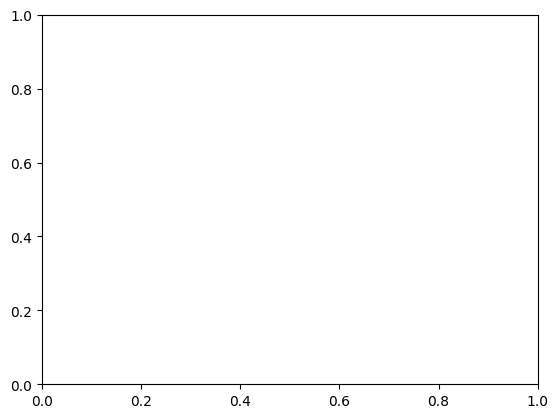

In [85]:
community_size_df.plot(figsize=(20, 10))
plt.xlabel('Number of communities')
plt.ylabel('monthly interval')
plt.title('Evolution of the number of communities by month from 01/01/2015 to 01/06/2017')
plt.show()

## Temporal graph with Teneto

Teneto is a python library that allow to create temporal graph and compute community detection on it.  
[documentation](https://teneto.readthedocs.io/en/latest/tutorial/networkrepresentation.html)  
